# Enhancer code analysis

In this notebook we will go over how to obtain cell type characteristic sequence patterns from CREsted models, or any other model, using CREsted functionality and the extra packages from `crested[motif]`: tfmodisco-lite and memesuite-lite.

In [1]:
# Set package settings
import matplotlib
import os

## Set the font type to ensure text is saved as whole words
matplotlib.rcParams["pdf.fonttype"] = 42  # Use TrueType fonts instead of Type 3 fonts
matplotlib.rcParams["ps.fonttype"] = 42  # For PostScript as well, if needed

## Set the base directory for data retrieval with crested.get_dataset()/get_model()
os.environ['CRESTED_DATA_DIR'] = '/staging/leuven/stg_00002/lcb/cblaauw/'

## Obtaining contribution scores per model class and running tfmodisco-lite

Before we can do any analysis, we need to calculate the contribution scores for cell type-specific regions. These regions hold the most sequence information relevant for cell type identity.
From those, we can run tfmodisco-lite.

In [2]:
import anndata as ad
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import crested
import keras
import pickle

2026-02-20 13:20:19.573628: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2026-02-20 13:20:35.033246: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI AVX512_BF16 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2026-02-20 13:21:14.286210: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


### Load data and CREsted model
We'll load the filtered dataset and model from the [the introduction notebook](project:model_training_and_eval.rst):

In [3]:
# Set the genome
genome = crested.Genome("mm10/genome.fa", "mm10/genome.chrom.sizes")
crested.register_genome(genome)  # Register the genome so that it's automatically used in every function

2026-02-20T13:22:01.718526+0100 INFO Genome genome registered.


In [4]:
# Read in the anndata
adata = ad.read_h5ad("crested/mouse_cortex.h5ad")

### Select the most informative regions per cell type

To obtain cell type-characteristic patterns, we need to calculate contribution scores on highly specific regions. For this purpose, we've included a preprocessing function {func}`crested.pp.sort_and_filter_regions_on_specificity` to keep the top k most specific regions per cell type that you can use to filter your data before running modisco.

There are three options to select the top regions: either purely based on peak height, purely based on predictions, or on their combination. Here we show how to use the combination of both (which we recommend, see [Johansen & Kempynck et al., 2025](https://doi.org/10.1016/j.xgen.2025.100879)).

In [5]:
# Load a trained model
model_path = "mouse_biccn/finetuned_model/checkpoints/02.keras" # change to your model path
model = keras.models.load_model(model_path, compile=False)

2026-02-19 10:15:17.076970: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1928] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 78752 MB memory:  -> device: 0, name: NVIDIA H100 80GB HBM3, pci bus id: 0000:a6:00.0, compute capability: 9.0


In [6]:
# Store predictions for all our regions in the anndata object
predictions = crested.tl.predict(adata, model)
adata.layers["biccn_model"] = predictions.T

2026-02-18T22:04:41.666517+0100 INFO Lazily importing module crested.tl. This could take a second...


I0000 00:00:1771448727.423142  114805 service.cc:145] XLA service 0x150864003eb0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1771448727.460713  114805 service.cc:153]   StreamExecutor device (0): NVIDIA H100 80GB HBM3, Compute Capability 9.0
2026-02-18 22:05:29.570127: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2026-02-18 22:05:32.264588: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:465] Loaded cuDNN version 8902


   7/4274 ━━━━━━━━━━━━━━━━━━━━ 1:55 27ms/step 

I0000 00:00:1771448747.505879  114805 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


4272/4274 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

I0000 00:00:1771448868.542375  115059 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'triton_gemm_dot_369', 4 bytes spill stores, 4 bytes spill loads

I0000 00:00:1771448868.597819  115066 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'triton_gemm_dot_369', 4 bytes spill stores, 4 bytes spill loads



4274/4274 ━━━━━━━━━━━━━━━━━━━━ 145s 29ms/step


In [7]:
# Calculate the average of the ground truth and predictions
adata.layers['combined'] = (adata.X + adata.layers["biccn_model"])/2

We can use {func}`crested.pl.qc.sort_and_filter_cutoff` to look at the gini score distributions for the different regions per class.

Here, we take the top 2000 most specific regions, but top 500 or 1000 regions would give similar results.

2026-02-18T22:07:53.298189+0100 INFO Lazily importing module crested.pl. This could take a second...


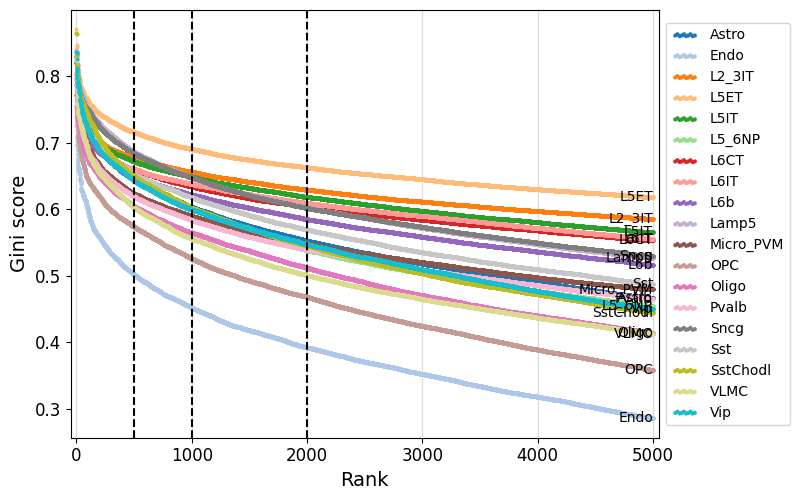

In [8]:
%matplotlib inline
crested.pl.qc.sort_and_filter_cutoff(adata, model_name="combined", cutoffs=[500, 1000, 2000], max_k=5000)

In [9]:
# Filter most informative regions per class
top_k = 2000
adata_filtered = crested.pp.sort_and_filter_regions_on_specificity(adata, model_name="combined", top_k=top_k, method="gini", inplace=False)
adata_filtered

2026-02-18T22:09:56.457403+0100 INFO After sorting and filtering, kept 38000 regions.


AnnData object with n_obs × n_vars = 19 × 38000
    obs: 'file_path'
    var: 'chr', 'start', 'end', 'target_start', 'target_end', 'split', 'Class name', 'rank', 'gini_score'
    obsm: 'weights'
    layers: 'biccn_model', 'combined'

In [10]:
adata_filtered.var

,chr,start,end,target_start,target_end,split,Class name,rank,gini_score
region,,,,,,,,,
chr10:45499432-45501546,chr10,45499432,45501546,45499989,45500989,val,Astro,1,0.830273
chr5:9868290-9870404,chr5,9868290,9870404,9868847,9869847,train,Astro,2,0.819487
chr2:65274604-65276718,chr2,65274604,65276718,65275161,65276161,train,Astro,3,0.818493
chrX:23135863-23137977,chrX,23135863,23137977,23136420,23137420,train,Astro,4,0.816922
chr3:115410072-115412186,chr3,115410072,115412186,115410629,115411629,train,Astro,5,0.815808
...,...,...,...,...,...,...,...,...,...
chr3:49982863-49984977,chr3,49982863,49984977,49983420,49984420,train,Vip,1996,0.547537
chr5:97165626-97167740,chr5,97165626,97167740,97166183,97167183,train,Vip,1997,0.547428
chr1:19158560-19160674,chr1,19158560,19160674,19159117,19160117,train,Vip,1998,0.547314


### Calculating contribution scores per class

Now you can calculate the contribution scores for all the regions in your filtered anndata.  
By default, the contribution scores are calculated using the expected integrated gradients method, but you can change this to simple integrated gradients to speed up the calculation (this might result in less accurate scores).

In [11]:
crested.tl.contribution_scores_specific(
    input=adata_filtered,
    target_idx=None,  # We calculate for all classes
    model=model,
    output_dir="modisco_results_ft_2000",
    method="integrated_grad"
)

2026-02-18T22:09:57.090369+0100 INFO Calculating contribution scores for 1 class(es) and 2000 region(s).


Model: 100%|██████████| 1/1 [01:51<00:00, 111.24s/it]


2026-02-18T22:12:03.960105+0100 INFO Calculating contribution scores for 1 class(es) and 2000 region(s).


Model: 100%|██████████| 1/1 [01:43<00:00, 103.14s/it]


2026-02-18T22:14:02.281014+0100 INFO Calculating contribution scores for 1 class(es) and 2000 region(s).


Model: 100%|██████████| 1/1 [01:42<00:00, 102.64s/it]


2026-02-18T22:16:00.581708+0100 INFO Calculating contribution scores for 1 class(es) and 2000 region(s).


Model: 100%|██████████| 1/1 [01:42<00:00, 102.96s/it]


2026-02-18T22:17:59.153553+0100 INFO Calculating contribution scores for 1 class(es) and 2000 region(s).


Model: 100%|██████████| 1/1 [01:42<00:00, 102.81s/it]


2026-02-18T22:19:57.538069+0100 INFO Calculating contribution scores for 1 class(es) and 2000 region(s).


Model: 100%|██████████| 1/1 [01:42<00:00, 102.70s/it]


2026-02-18T22:21:55.870284+0100 INFO Calculating contribution scores for 1 class(es) and 2000 region(s).


Model: 100%|██████████| 1/1 [01:42<00:00, 102.63s/it]


2026-02-18T22:25:52.376153+0100 INFO Calculating contribution scores for 1 class(es) and 2000 region(s).


Model: 100%|██████████| 1/1 [01:42<00:00, 102.46s/it]


2026-02-18T22:27:50.404973+0100 INFO Calculating contribution scores for 1 class(es) and 2000 region(s).


Model: 100%|██████████| 1/1 [01:42<00:00, 102.72s/it]


2026-02-18T22:29:48.763463+0100 INFO Calculating contribution scores for 1 class(es) and 2000 region(s).


Model: 100%|██████████| 1/1 [01:42<00:00, 102.62s/it]


2026-02-18T22:31:46.930498+0100 INFO Calculating contribution scores for 1 class(es) and 2000 region(s).


Model: 100%|██████████| 1/1 [01:42<00:00, 102.47s/it]


2026-02-18T22:33:46.036175+0100 INFO Calculating contribution scores for 1 class(es) and 2000 region(s).


Model: 100%|██████████| 1/1 [01:42<00:00, 102.51s/it]


2026-02-18T22:35:44.168858+0100 INFO Calculating contribution scores for 1 class(es) and 2000 region(s).


Model: 100%|██████████| 1/1 [01:42<00:00, 102.74s/it]


2026-02-18T22:37:42.562841+0100 INFO Calculating contribution scores for 1 class(es) and 2000 region(s).


Model: 100%|██████████| 1/1 [01:42<00:00, 102.54s/it]


2026-02-18T22:39:40.721231+0100 INFO Calculating contribution scores for 1 class(es) and 2000 region(s).


Model: 100%|██████████| 1/1 [01:42<00:00, 102.82s/it]


2026-02-18T22:41:39.174031+0100 INFO Calculating contribution scores for 1 class(es) and 2000 region(s).


Model: 100%|██████████| 1/1 [01:42<00:00, 102.91s/it]


2026-02-18T22:43:37.742379+0100 INFO Calculating contribution scores for 1 class(es) and 2000 region(s).


Model: 100%|██████████| 1/1 [01:42<00:00, 102.58s/it]


2026-02-18T22:45:35.769823+0100 INFO Calculating contribution scores for 1 class(es) and 2000 region(s).


Model: 100%|██████████| 1/1 [01:42<00:00, 102.60s/it]


(array([[[[-1.48615626e-07, -5.54927112e-07,  4.07066267e-07, ...,
           -1.79133679e-07,  7.91571267e-07, -9.54171497e-08],
          [ 2.84154055e-07,  3.62958559e-07,  6.59639511e-07, ...,
            1.65198423e-06,  6.93648587e-07,  6.85019188e-07],
          [ 1.58720212e-07,  1.27419142e-07,  2.07420385e-07, ...,
           -7.57875739e-07, -7.95578956e-07, -2.73807672e-07],
          [-2.04508495e-07,  3.26645903e-07, -9.35306844e-07, ...,
           -9.60897182e-07,  3.23470566e-08, -3.14376678e-07]]],
 
 
        [[[ 1.38958785e-06, -1.30966725e-06, -5.06607375e-06, ...,
           -1.16397632e-05, -5.93204959e-06, -3.62574792e-06],
          [-3.17109595e-07,  2.51010647e-07, -3.71272307e-07, ...,
            1.86718694e-06,  2.69274597e-06,  4.92592653e-06],
          [ 2.27687622e-07, -7.58866179e-07,  1.47926028e-06, ...,
            3.09061252e-05,  1.20547866e-05, -5.71382179e-06],
          [-1.85486203e-06,  3.86895226e-06,  4.91772153e-06, ...,
           -1.047

### Running tfmodisco-lite

When this is done, you can run TF-MoDISco-lite on the saved contribution scores to find motifs that are important for the classification/regression task.  

You could use the tfmodisco package directly to do this, or you could use the {func}`crested.tl.modisco.tfmodisco` function which is essentially a wrapper around the tfmodisco package.

**Note that from here on, you can use contribution scores from any model trained in any framework, as this analysis just requires a set of one hot encoded sequences and contribution scores per cell type stored in the same directory.**

If you don't have `tomtom` available on the command line, set `report=False` in {func}`crested.tl.modisco.tfmodisco`. You won't get an html report matching the motifs to their closest match in the motif database, but you'll still get a collection of clustered seqlets for use in the rest of the notebook.

In [12]:
meme_db, motif_to_tf_file = crested.get_motif_db()

In [ ]:
# run tfmodisco on the contribution scores
crested.tl.modisco.tfmodisco(
    window=1000,
    output_dir="modisco_results_ft_2000",
    contrib_dir="modisco_results_ft_2000",
    report=False,  # Optional, will match patterns to motif MEME database - deactivate if you don't have TOMTOM read on the command line
    meme_db=meme_db,  # File to MEME database - not needed if not generating reports
    max_seqlets=20000,
)

2026-02-18T22:48:10.031481+0100 INFO No class names provided, using all found in the contribution directory: ['Pvalb', 'Lamp5', 'L5ET', 'Oligo', 'L6IT', 'L2_3IT', 'Endo', 'Sst', 'L5IT', 'Sncg', 'Astro', 'VLMC', 'OPC', 'L6CT', 'Vip', 'L5_6NP', 'L6b', 'Micro_PVM', 'SstChodl']
2026-02-18T22:48:10.527970+0100 INFO Running modisco for class: Pvalb
Using 11070 positive seqlets
Extracted 1602 negative seqlets
2026-02-18T22:55:24.463964+0100 INFO Running modisco for class: Lamp5
Using 11127 positive seqlets
Extracted 1617 negative seqlets
2026-02-18T23:02:18.775590+0100 INFO Running modisco for class: L5ET
Using 12954 positive seqlets
Extracted 1638 negative seqlets
2026-02-18T23:10:50.207266+0100 INFO Running modisco for class: Oligo
Using 13245 positive seqlets
Extracted 3037 negative seqlets
2026-02-18T23:20:09.298092+0100 INFO Running modisco for class: L6IT
Using 15015 positive seqlets
2026-02-18T23:29:28.185590+0100 INFO Running modisco for class: L2_3IT
Using 15115 positive seqlets
Extr

## Analysis of cell-type specific sequence patterns

Once you have obtained your modisco results, you can plot the the found patterns using the {func}`crested.pl.modisco.modisco_results` function.

2026-02-19T10:17:00.047868+0100 INFO Starting genomic contributions plot for classes: ['Astro', 'L5ET', 'Vip', 'Oligo']


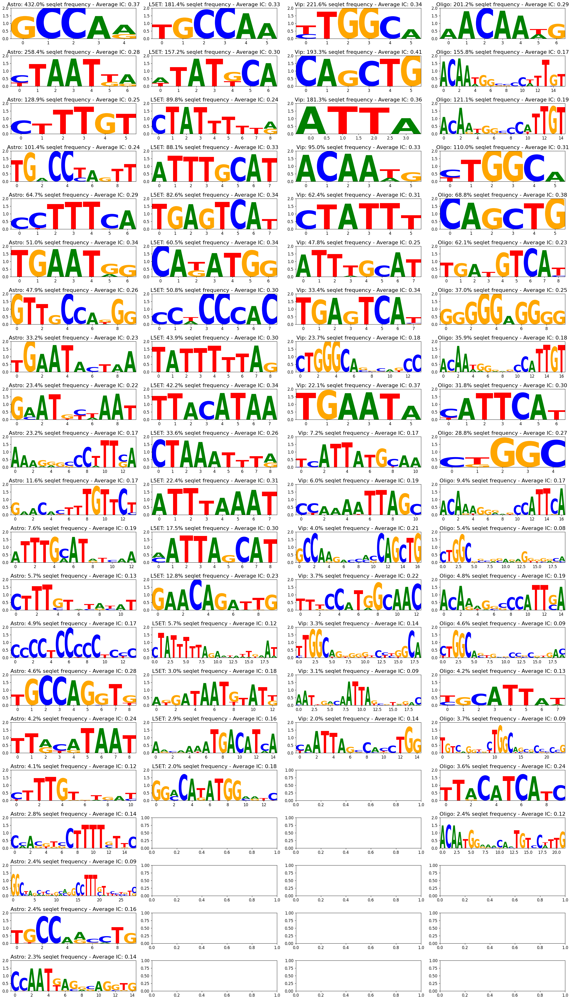

In [8]:
%matplotlib inline
top_k = 1000
crested.pl.modisco.modisco_results(
    classes=["Astro", "L5ET", "Vip", "Oligo"],
    contribution="positive",
    contribution_dir="modisco_results_ft_2000",
    num_seq=top_k,
    y_max=0.15,
    viz="pwm",
)  # You can also visualize in 'pwm' format

### Matching patterns across cell types

Since we have calculated per cell type the patterns independently of each other, we do not know quantitavely how and if they overlap.
It can be interesting to get an overview of which patterns are found across multiple cell types, how important they are, and if there are unique patterns only found in a small selection of classes.
Therefore, we have made a pattern clustering algorithm, which starts from the results of tfmodisco-lite, and return a pattern matrix, which contains the importance of the clustered patterns per cell type, and a pattern dictionary, describing all clustered patterns.

First, we'll obtain the modisco files per class by using {func}`crested.tl.modisco.match_h5_files_to_classes` using our selected classes.

In [5]:
# First we obtain the resulting modisco files per class
matched_files = crested.tl.modisco.match_h5_files_to_classes(
    contribution_dir="modisco_results_ft_2000", classes=list(adata.obs_names)
)

2026-02-19T11:48:01.680547+0100 INFO Lazily importing module crested.tl. This could take a second...


#### A quick pairwise comparison
Before we do any pattern clustering, we can check for each independent pattern how similar it is to all the other patterns using memesuite-lite. 
We use {func}`crested.tl.modisco.calculate_tomtom_similarity_per_pattern`. This function returns a pairwise similarity matrix of every unique pattern, together with a list of ids and a dictionary containing additional information per pattern.

In [6]:
sim_matrix, pattern_ids, pattern_dict = crested.tl.modisco.calculate_tomtom_similarity_per_pattern(
    matched_files=matched_files, trim_ic_threshold=0.025, verbose=True
)

Reading file modisco_results_ft_2000/Astro_modisco_results.h5
Reading file modisco_results_ft_2000/Endo_modisco_results.h5
Reading file modisco_results_ft_2000/L2_3IT_modisco_results.h5
Reading file modisco_results_ft_2000/L5ET_modisco_results.h5
Reading file modisco_results_ft_2000/L5IT_modisco_results.h5
Reading file modisco_results_ft_2000/L5_6NP_modisco_results.h5
Reading file modisco_results_ft_2000/L6CT_modisco_results.h5
Reading file modisco_results_ft_2000/L6IT_modisco_results.h5
Reading file modisco_results_ft_2000/L6b_modisco_results.h5
Reading file modisco_results_ft_2000/Lamp5_modisco_results.h5
Reading file modisco_results_ft_2000/Micro_PVM_modisco_results.h5
Reading file modisco_results_ft_2000/OPC_modisco_results.h5
Reading file modisco_results_ft_2000/Oligo_modisco_results.h5
Reading file modisco_results_ft_2000/Pvalb_modisco_results.h5
Reading file modisco_results_ft_2000/Sncg_modisco_results.h5
Reading file modisco_results_ft_2000/Sst_modisco_results.h5
Reading file m

We can now visualize this similarities using {func}`crested.pl.modisco.clustermap_tomtom_similarities`. We will subset the often large similarity matrix to a relevant subset. First, we will look at a pattern and find other patterns similar to it in other cell types. We add some additional group labels for visualization purposes.

In [7]:
nn = {"Astro", "Endo", "Micro_PVM", "OPC", "Oligo", "VLMC"}
exc = {"L2_3IT", "L5ET", "L5IT", "L5_6NP", "L6CT", "L6IT", "L6b"}
inh = {"Lamp5", "Pvalb", "Sncg", "Sst", "SstChodl", "Vip"}

groups, groups_2 = [], []
for id in pattern_ids:
    ct = "_".join(id.split("_")[:-3])
    groups.append(
        "Non-neuronal"
        if ct in nn
        else "Excitatory"
        if ct in exc
        else "Inhibitory"
        if ct in inh
        else (_ for _ in ()).throw(ValueError(f"Unknown class: {ct}"))
    )
    groups_2.append(ct)

unique_cats = pd.unique(groups_2)
group_colors_2 = {cat: mcolors.to_hex(plt.get_cmap("tab20", len(unique_cats))(i)) for i, cat in enumerate(unique_cats)}
group_colors = {"Non-neuronal": "skyblue", "Excitatory": "salmon", "Inhibitory": "green"}

/tmp/ipykernel_245842/4173896863.py:19: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  unique_cats = pd.unique(groups_2)


2026-02-19T11:49:10.404031+0100 INFO Lazily importing module crested.pl. This could take a second...


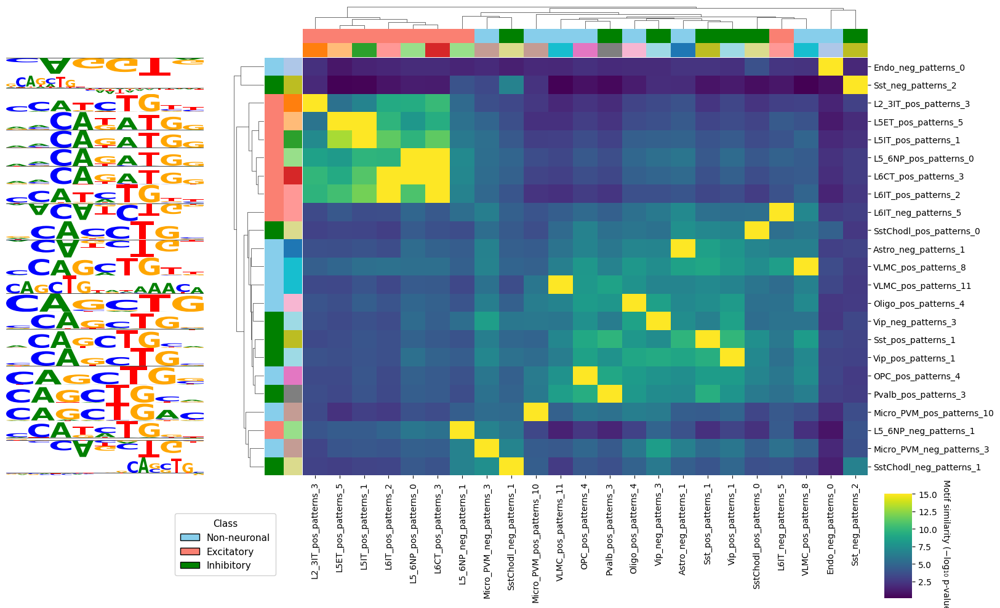

In [8]:
%matplotlib inline
crested.pl.modisco.clustermap_tomtom_similarities(
    sim_matrix=sim_matrix,
    ids=pattern_ids,
    pattern_dict=pattern_dict,
    group_info=[(groups, group_colors), (groups_2, group_colors_2)],  # Grouping labels
    query_id="Vip_pos_patterns_1",  # Find patterns similar to this one
    threshold=3,  # TOMTOM similarity threshold, we take the -log10(pval)
    min_seqlets=100,  # Add a minimum amount of seqlets to take the most relevant patterns
)

We can also use this to look at all the different patterns in a subset of cell types, and see if we can find interesting groups of similar motifs.

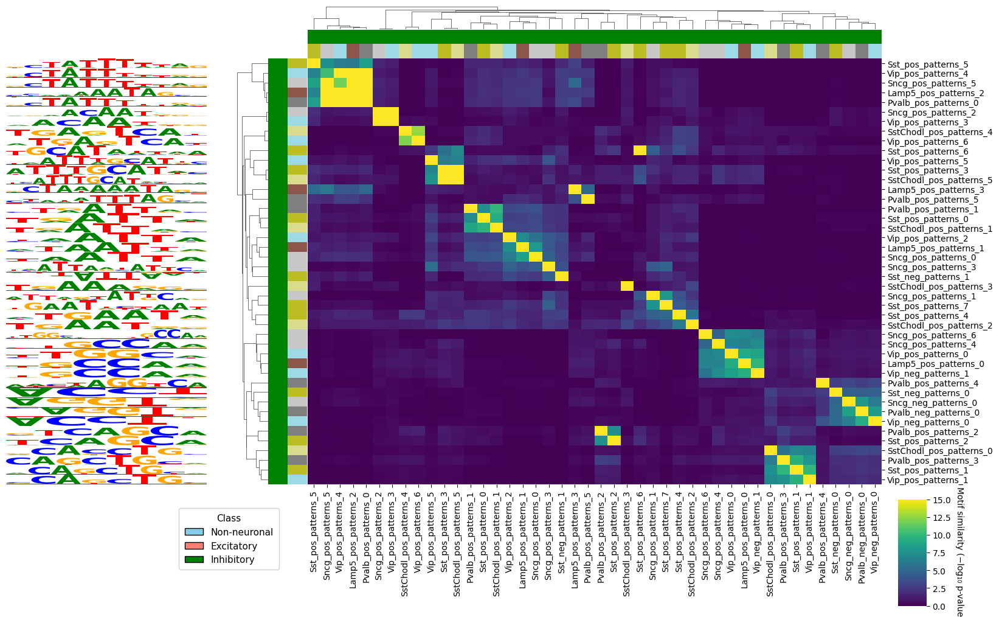

In [9]:
crested.pl.modisco.clustermap_tomtom_similarities(
    sim_matrix=sim_matrix,
    ids=pattern_ids,
    pattern_dict=pattern_dict,
    group_info=[(groups, group_colors), (groups_2, group_colors_2)],  # Grouping labels
    class_names=["Lamp5", "Pvalb", "Sncg", "Sst", "SstChodl", "Vip"],  # Subset of classes to use patterns from
    min_seqlets=300,  # Add a minimum amount of seqlets to take the most relevant patterns
)

#### Pattern clustering across cell types
Since many patterns are similar and can be matched across cell types, we can also cluster them into groups and compare the importance of that matched motif over all cell types. We cluster all separate patterns using {func}`crested.tl.modisco.process_patterns` and create a pattern matrix with {func}`crested.tl.modisco.create_pattern_matrix`.

In [10]:
# Then we cluster matching patterns, and define a pattern matrix [#classes, #patterns] describing their importance
all_patterns = crested.tl.modisco.process_patterns(
    matched_files,
    sim_threshold=4.25,  # The similarity threshold used for matching patterns. We take the -log10(pval), pval obtained through TOMTOM matching from memesuite-lite
    trim_ic_threshold=0.05,  # Information content (IC) threshold on which to trim patterns
    discard_ic_threshold=0.2,  # IC threshold used for discarding single instance patterns
    verbose=True,  # Useful for doing sanity checks on matching patterns
)
pattern_matrix = crested.tl.modisco.create_pattern_matrix(
    classes=list(adata.obs_names),
    all_patterns=all_patterns,
    normalize=False,
    pattern_parameter="seqlet_count_log",
)
pattern_matrix.shape

Reading file modisco_results_ft_2000/Astro_modisco_results.h5
Match between Astro_pos_patterns_9 and Astro_pos_patterns_4 with similarity score 5.68
Match between Astro_pos_patterns_16 and Astro_pos_patterns_2 with similarity score 8.06
Match between Astro_pos_patterns_18 and Astro_pos_patterns_12 with similarity score 6.32
Reading file modisco_results_ft_2000/Endo_modisco_results.h5
Match between Endo_neg_patterns_0 and Astro_neg_patterns_2 with similarity score 5.24
Match between Endo_neg_patterns_7 and Endo_neg_patterns_6 with similarity score 4.81
Match between Endo_neg_patterns_8 and Astro_pos_patterns_8 with similarity score 4.90
Match between Endo_neg_patterns_9 and Astro_pos_patterns_13 with similarity score 4.31
Match between Endo_neg_patterns_14 and Endo_neg_patterns_7 with similarity score 5.25
Match between Endo_pos_patterns_1 and Endo_neg_patterns_10 with similarity score 4.98
Match between Endo_pos_patterns_6 and Endo_pos_patterns_3 with similarity score 5.09
Match betwee

(19, 183)

Now we can plot a clustermap of cell types/classes and patterns, where the classes are clustered 
purely on pattern importance with {func}`crested.tl.modisco.generate_nucleotide_sequences` and {func}`crested.pl.modisco.clustermap`

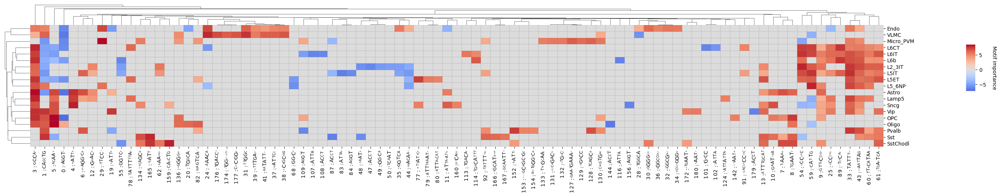

In [11]:
pat_seqs = crested.tl.modisco.generate_nucleotide_sequences(all_patterns)
crested.pl.modisco.clustermap(
    pattern_matrix,
    list(adata.obs_names),
    width=25,
    height=4.2,
    pat_seqs=pat_seqs,
    grid=True,
    dendrogram_ratio=(0.03, 0.15),
    importance_threshold=5,
)

If you have the horizontal space for it, you can also add the PWM/contribution logos to the x-axis.

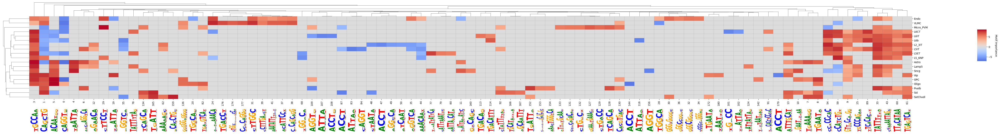

In [12]:
crested.pl.modisco.clustermap_with_pwm_logos(
    pattern_matrix,
    list(adata.obs_names),
    pattern_dict=all_patterns,
    width=50,
    height=4.2,
    grid=True,
    dendrogram_ratio=(0.03, 0.15),
    importance_threshold=5,
    logo_x_multiplier=1,
    logo_height_fraction=0.35,
    logo_y_padding=0.25,
)

We can also subset to classes we are interested in and want to compare in more detail.

2026-02-19T13:59:06.619497+0100 WARNING Argument `figsize` is deprecated since version 2.0.0; please use width and height instead.


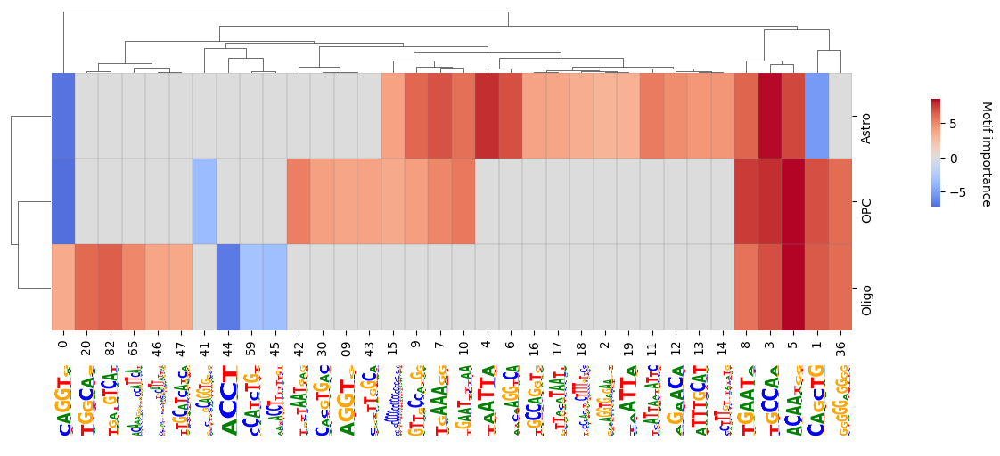

In [13]:
pat_seqs = crested.tl.modisco.generate_nucleotide_sequences(all_patterns)
crested.pl.modisco.clustermap_with_pwm_logos(
    pattern_matrix,
    classes=list(adata.obs_names),
    pattern_dict=all_patterns,
    subset=["Astro", "OPC", "Oligo"],
    width=10,
    height=3,
    grid=True,
    logo_height_fraction=0.35,
    logo_y_padding=0.3,
)

2026-02-19T13:59:25.718974+0100 WARNING Argument `figsize` is deprecated since version 2.0.0; please use width and height instead.


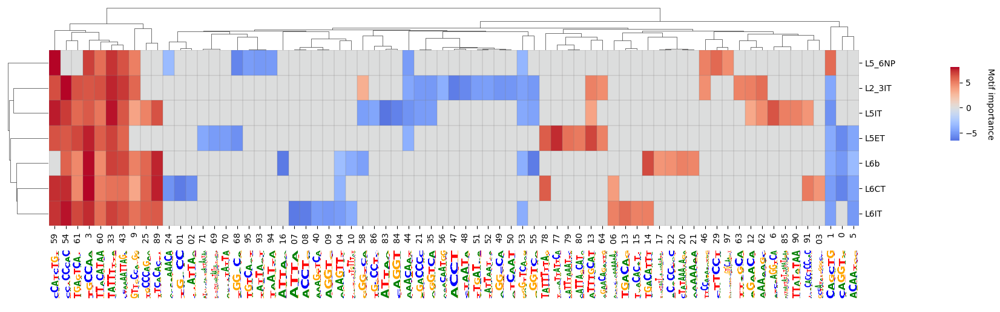

In [14]:
pat_seqs = crested.tl.modisco.generate_nucleotide_sequences(all_patterns)
crested.pl.modisco.clustermap_with_pwm_logos(
    pattern_matrix,
    classes=list(adata.obs_names),
    subset=["L2_3IT", "L5ET", "L5IT", "L5_6NP", "L6CT", "L6IT", "L6b"],
    pattern_dict=all_patterns,
    width=15,
    height=3,
    grid=True,
    logo_height_fraction=0.35,
    logo_y_padding=0.3,
    importance_threshold=4,
)

#### Additional pattern insights

It is always interesting to investigate specific patterns show in the clustermap above. Here there are some example function on how to do that.

Plotting patterns based on their indices can be done with {func}`crested.pl.modisco.selected_instances`

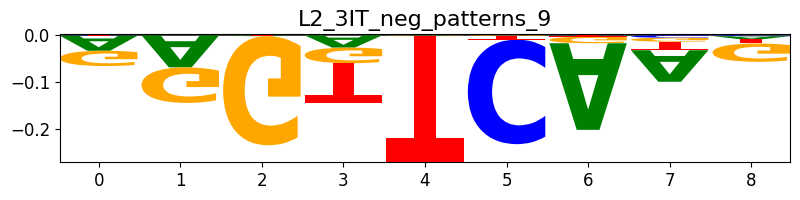

In [15]:
pattern_indices = [53]
crested.pl.modisco.selected_instances(
    all_patterns, pattern_indices
)  # The pattern that is shown is the most representative pattern of the cluster with the highest average information content (IC)

We can also do a check of pattern similarity

Pattern similarity is 0.7527711866474396


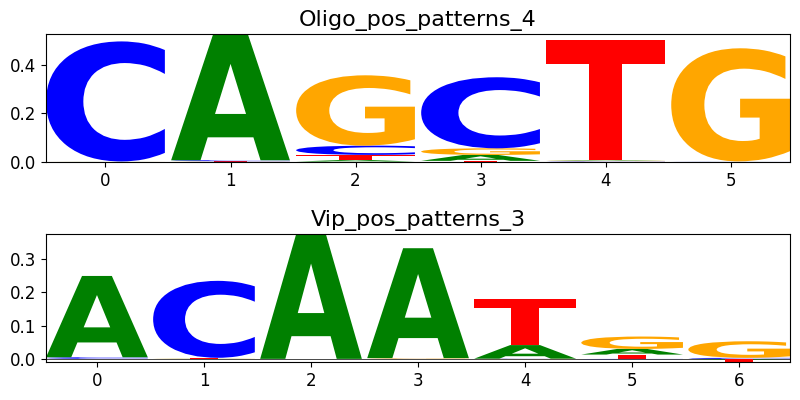

In [16]:
idx1 = 1
idx2 = 5
sim = crested.tl.modisco.pattern_similarity(all_patterns, idx1, idx2)
print("Pattern similarity is " + str(sim))
crested.pl.modisco.selected_instances(all_patterns, [idx1, idx2])

We can plot all the instances of patterns in the same cluster with {func}`crested.pl.modisco.class_instances`

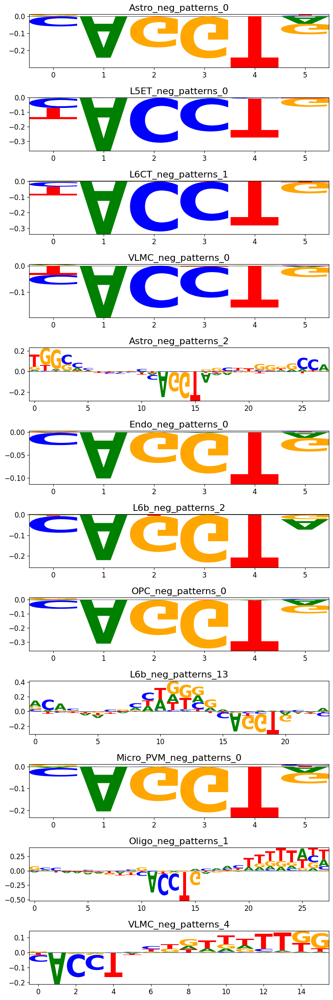

In [17]:
crested.pl.modisco.class_instances(all_patterns, 0)

If you want to find out in which pattern cluster a certain pattern is from your modisco results, you can call the {func}`crested.tl.modisco.find_pattern` function.

Pattern index is 0


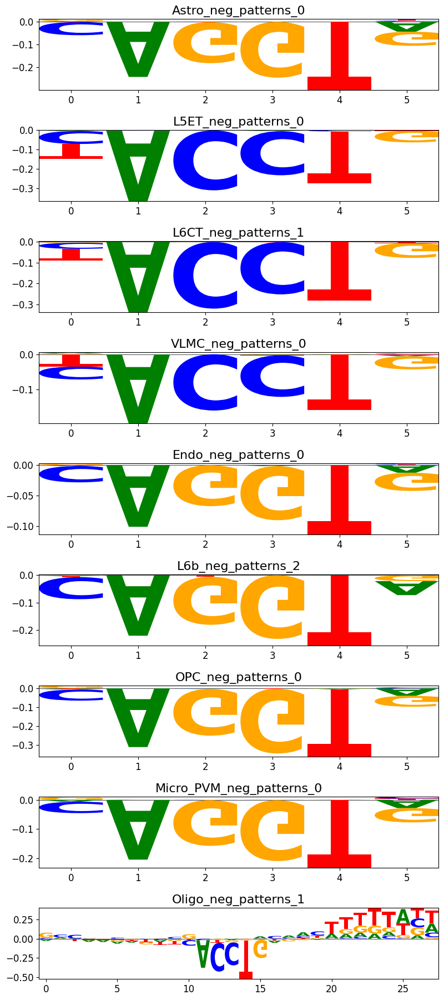

In [18]:
idx = crested.tl.modisco.find_pattern("OPC_neg_patterns_0", all_patterns)
if idx is not None:
    print("Pattern index is " + str(idx))
    crested.pl.modisco.class_instances(all_patterns, idx, class_representative=True)

Finally we can also plot the similarity between all patterns with {func}`crested.tl.modisco.calculate_similarity_matrix` and {func}`crested.pl.modisco.similarity_heatmap`

2026-02-19T14:39:15.500681+0100 WARNING `fig_size` is deprecated since version 2.0.0; please use arguments `width` and `height` instead.


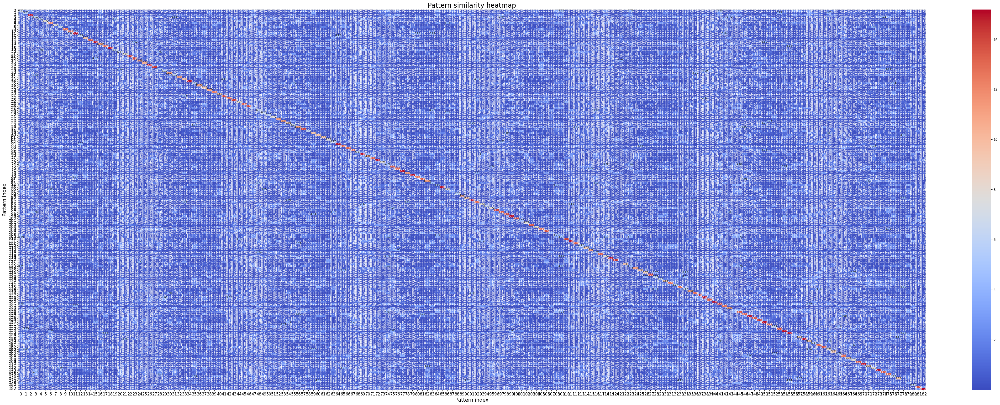

In [19]:
sim_matrix, indices = crested.tl.modisco.calculate_similarity_matrix(all_patterns)
crested.pl.modisco.similarity_heatmap(sim_matrix, indices, fig_size=(42, 17))

In [ ]:
# Optional: save the matched patterns if you want to re-use them later
with open("modisco_results_ft_2000/all_patterns.pkl", 'wb') as f:
    pickle.dump(all_patterns, f)

### Matching patterns to TF candidates from scRNA-seq data [Optional]

To understand the actual transcription factor (TF) candidates binding to the characteristic patterns/potential binding sites per cell type, we can propose potential candidates through scRNA-seq data and a TF-motif collection file.

**This analysis requires that you ran tfmodisco-lite with the report function such that each pattern has potential MEME database hits and that you have multiome data.**
The names in the motif database should match those in the TF-motif collection file. 

In [5]:
meme_db, motif_to_tf_file = crested.get_motif_db()

If you haven't run this yet and using `crested.tl.modisco.tfmodisco` did not work due to lack of access to TOMTOM, versions of `modiscolite` above v2.4.0 also support using `memelite` with argument `ttl=True`, meaning you can generate the reports this way:

In [15]:
import modiscolite as modisco
output_dir = "modisco_results_ft_2000"
for class_name in adata.obs_names:
    print(class_name)
    output_file = os.path.join(output_dir, f"{class_name}_modisco_results.h5")
    report_dir = os.path.join(output_dir, f"{class_name}_report")
    modisco.report.report_motifs(
        output_file,
        report_dir,
        meme_motif_db=meme_db,
        top_n_matches=3,
        is_writing_tomtom_matrix=False,
        img_path_suffix="./",
        ttl=True
    )

Astro
Endo
L2_3IT
L5ET
L5IT
L5_6NP
L6CT
L6IT
L6b
Lamp5
Micro_PVM
OPC
Oligo
Pvalb
Sncg
Sst
SstChodl
VLMC
Vip


In [6]:
# If you don't have the patterns loaded, load here
with open('modisco_results_ft_2000/all_patterns.pkl', 'rb') as f:
    all_patterns = pickle.load(f)

#### Load scRNA-seq data

Load scRNA seq data and calculate mean expression per cell type using {func}`crested.tl.modisco.calculate_mean_expression_per_cell_type`

In [7]:
file_path = "crested/Mouse_rna.h5ad"  # Locate h5 file containing scRNAseq data
cell_type_column = "subclass_Bakken_2022"
mean_expression_df = crested.tl.modisco.calculate_mean_expression_per_cell_type(
    file_path, cell_type_column, cpm_normalize=True
)

2026-02-20T13:22:02.547632+0100 INFO Lazily importing module crested.tl. This could take a second...


/lustre1/project/stg_00002/lcb/cblaauw/python_modules/CREsted/src/crested/tl/modisco/_tfmodisco.py:1537: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  mean_expression_per_cell_type = gene_expression_df.groupby(


In [8]:
# Rename classes that don't match exactly (due to / being cleaned up to _, etc) 
# Here they're in the same (alphabetical) order anyway so we can just zip them
class_mapping = dict(zip(mean_expression_df.index, adata.obs_names))
print(class_mapping)

mean_expression_df.index = mean_expression_df.index.map(class_mapping)

{'Astro': 'Astro', 'Endo': 'Endo', 'L2/3 IT': 'L2_3IT', 'L5 ET': 'L5ET', 'L5 IT': 'L5IT', 'L5/6 NP': 'L5_6NP', 'L6 CT': 'L6CT', 'L6 IT': 'L6IT', 'L6b': 'L6b', 'Lamp5': 'Lamp5', 'Micro-PVM': 'Micro_PVM', 'OPC': 'OPC', 'Oligo': 'Oligo', 'Pvalb': 'Pvalb', 'Sncg': 'Sncg', 'Sst': 'Sst', 'Sst Chodl': 'SstChodl', 'VLMC': 'VLMC', 'Vip': 'Vip'}


2026-02-20T13:22:12.004209+0100 INFO Lazily importing module crested.pl. This could take a second...


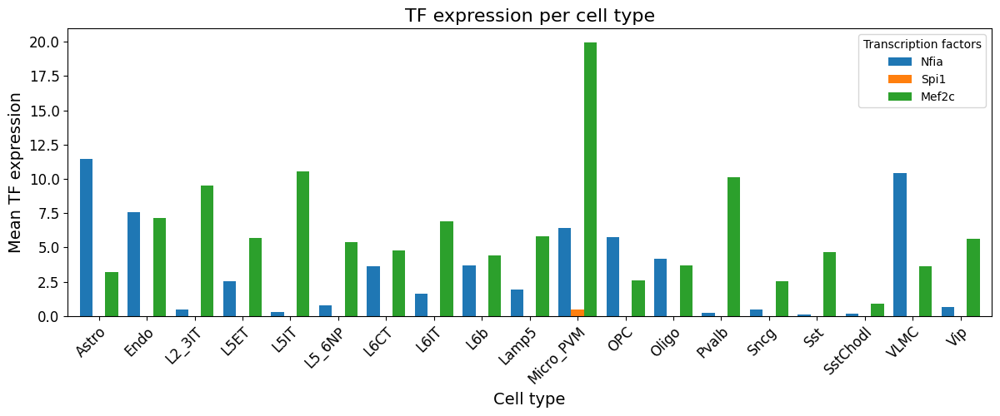

In [9]:
crested.pl.modisco.tf_expression_per_cell_type(mean_expression_df, ["Nfia", "Spi1", "Mef2c"])

#### Generating pattern to database motif dictionary

In [10]:
classes = list(adata.obs_names)
contribution_dir = "modisco_results_ft_2000"
html_paths = crested.tl.modisco.generate_html_paths(all_patterns, classes, contribution_dir)

# p_val threshold to only select significant matches
pattern_match_dict = crested.tl.modisco.find_pattern_matches(
    all_patterns, html_paths, p_val_thr=0.05
)  

#### Loading TF-motif database

In [11]:
motif_to_tf_df = crested.tl.modisco.read_motif_to_tf_file(motif_to_tf_file)
motif_to_tf_df

,logo,Motif_name,Cluster,Human_Direct_annot,Human_Orthology_annot,Mouse_Direct_annot,Mouse_Orthology_annot,Fly_Direct_annot,Fly_Orthology_annot,Cluster_Human_Direct_annot,Cluster_Human_Orthology_annot,Cluster_Mouse_Direct_annot,Cluster_Mouse_Orthology_annot,Cluster_Fly_Direct_annot,Cluster_Fly_Orthology_annot
0,"<img src=""https://motifcollections.aertslab.org/v10/logos/bergman__Adf1.png"" height=""52"" alt=""bergman__Adf1""></img>",bergman__Adf1,NaN,NaN,NaN,NaN,NaN,Adf1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,"<img src=""https://motifcollections.aertslab.org/v10/logos/bergman__Aef1.png"" height=""52"" alt=""bergman__Aef1""></img>",bergman__Aef1,NaN,NaN,NaN,NaN,NaN,Aef1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,"<img src=""https://motifcollections.aertslab.org/v10/logos/bergman__ap.png"" height=""52"" alt=""bergman__ap""></img>",bergman__ap,NaN,NaN,NaN,NaN,NaN,ap,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,"<img src=""https://motifcollections.aertslab.org/v10/logos/elemento__ACCTTCA.png"" height=""52"" alt=""elemento__ACCTTCA""></img>",elemento__ACCTTCA,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,"<img src=""https://motifcollections.aertslab.org/v10/logos/bergman__bcd.png"" height=""52"" alt=""bergman__bcd""></img>",bergman__bcd,NaN,NaN,NaN,NaN,NaN,bcd,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17990,"<img src=""https://motifcollections.aertslab.org/v10/logos/elemento__CAAGGAG.png"" height=""52"" alt=""elemento__CAAGGAG""></img>",elemento__CAAGGAG,98.3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
17991,"<img src=""https://motifcollections.aertslab.org/v10/logos/elemento__TCCTTGC.png"" height=""52"" alt=""elemento__TCCTTGC""></img>",elemento__TCCTTGC,98.3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
17992,"<img src=""https://motifcollections.aertslab.org/v10/logos/swissregulon__hs__ZNF274.png"" height=""52"" alt=""swissregulon__hs__ZNF274""></img>",swissregulon__hs__ZNF274,99.1,ZNF274,NaN,NaN,"Zfp369, Zfp110",NaN,NaN,ZNF274,NaN,NaN,"Zfp369, Zfp110",NaN,NaN
17993,"<img src=""https://motifcollections.aertslab.org/v10/logos/swissregulon__sacCer__THI2.png"" height=""52"" alt=""swissregulon__sacCer__THI2""></img>",swissregulon__sacCer__THI2,99.2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


#### Matching patterns to TF candidates

We calculate a pattern-tf by cell type matrix which contains the imporatance of each pattern linked to a TF per cell type using {func}`crested.tl.modisco.create_pattern_tf_dict` and {func}`crested.tl.modisco.create_tf_ct_matrix`

In [12]:
cols = [
    "Mouse_Direct_annot",
    "Mouse_Orthology_annot",
    "Cluster_Mouse_Direct_annot",
    "Cluster_Mouse_Orthology_annot",
]
pattern_tf_dict, all_tfs = crested.tl.modisco.create_pattern_tf_dict(
    pattern_match_dict, motif_to_tf_df, all_patterns, cols
)
tf_ct_matrix, tf_pattern_annots = crested.tl.modisco.create_tf_ct_matrix(
    pattern_tf_dict,
    all_patterns,
    mean_expression_df,
    classes,
    log_transform=True,
    normalize_pattern_importances=False,
    normalize_gex=True,
    min_tf_gex=0.95,
    importance_threshold=5.5,
    pattern_parameter="seqlet_count_log",
    filter_correlation=True,
    verbose=True,
    zscore_threshold=1.5,
    correlation_threshold=0.35,
)

Total columns before threshold filtering: 2845
Total columns after threshold filtering: 300
Total columns removed: 2545
Total columns before correlation filtering: 300
Total columns after correlation filtering: 169
Total columns removed: 131


Finally, we can plot a clustermap of potential pattern-TF matches and their importance per cell type with {func}`crested.pl.modisco.clustermap_tf_motif`

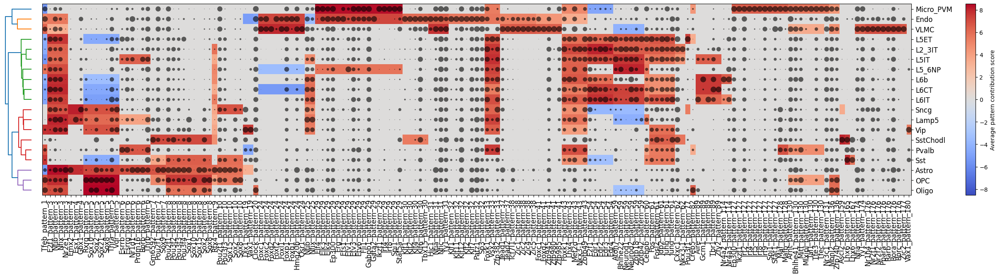

In [13]:
crested.pl.modisco.clustermap_tf_motif(
    tf_ct_matrix,
    heatmap_dim="contrib",
    dot_dim="gex",
    class_labels=classes,
    pattern_labels=tf_pattern_annots,
    width=35,
    height=6,
    cluster_rows=True,
    cluster_columns=False,
    xtick_rotation=90,
)

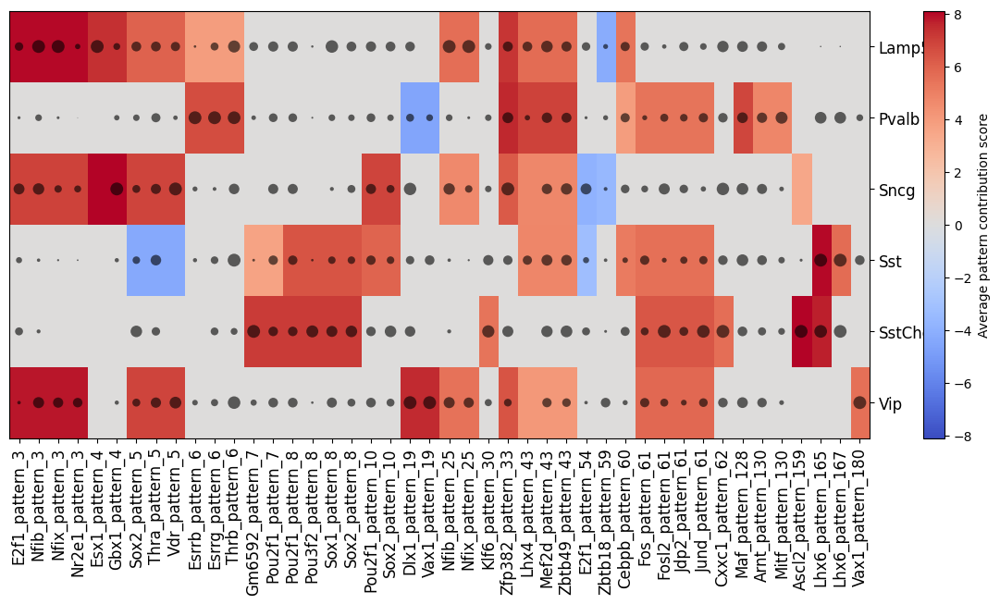

In [15]:
crested.pl.modisco.clustermap_tf_motif(
    tf_ct_matrix,
    heatmap_dim="contrib",
    dot_dim="gex",
    class_labels=classes,
    subset_classes=["Lamp5", "Sncg", "Vip", "Pvalb", "Sst", "SstChodl"],
    pattern_labels=tf_pattern_annots,
    width=15,
    height=6,
    cluster_rows=False,
    cluster_columns=False,
    xtick_rotation=90,
)